In [1]:
import torch
import torch.functional as F
import torch.nn as nn

import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
from einops import rearrange, reduce, reduce, repeat
from utils import display_np_arrays_as_images, display_tensors_as_images
display_np_arrays_as_images()
display_tensors_as_images()

In [2]:
from PIL import Image
img = Image.open('data/dog.jpg')
img = np.asarray(img)
img_t = torch.from_numpy(img).float().clone()
std, mean = torch.std_mean(img_t, dim=(0,1), unbiased=False)

def normalize(t, dim=(0,1)):
    std, mean = torch.std_mean(t, dim, unbiased=False)
    return t.sub(mean).div(std), (std, mean)

def denormalize(t, mean, std):
    return t.mul(std).add(mean)

norm, (std, mean) = normalize(img_t)
denorm = denormalize(norm, mean, std)
torch.allclose(denorm, img_t)

/var/folders/jk/w8lkkz7n40s81208_5_qd5_80000gn/T/ipykernel_32782/3544130142.py:4: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/miniforge3/conda-bld/pytorch-recipe_1675740423504/work/torch/csrc/utils/tensor_numpy.cpp:205.)
  img_t = torch.from_numpy(img).float().clone()


True

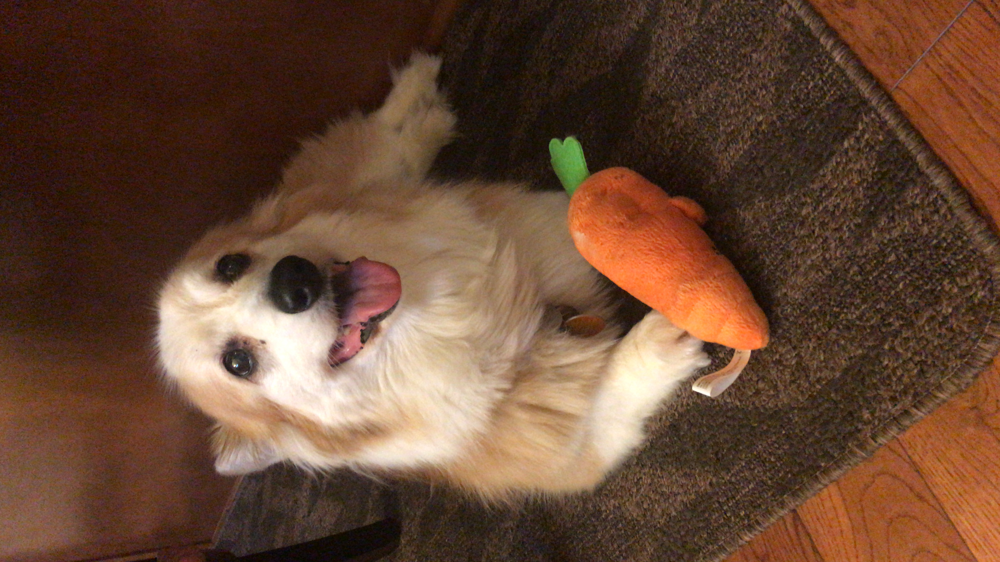

In [3]:
denorm